In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

In [2]:
os.environ['KAGGLE_USERNAME'] = 'sonalchandra'
os.environ['KAGGLE_KEY'] = 'f45b6c74289f2449d67fca08978096ca'

In [3]:
#download dataset
! kaggle datasets download -d trolukovich/food11-image-dataset

Dataset URL: https://www.kaggle.com/datasets/trolukovich/food11-image-dataset
License(s): CC0-1.0
 99% 1.07G/1.08G [00:12<00:00, 91.5MB/s]
100% 1.08G/1.08G [00:12<00:00, 95.6MB/s]


In [4]:
!unzip /content/food11-image-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: training/Soup/223.jpg   
  inflating: training/Soup/224.jpg   
  inflating: training/Soup/225.jpg   
  inflating: training/Soup/226.jpg   
  inflating: training/Soup/227.jpg   
  inflating: training/Soup/228.jpg   
  inflating: training/Soup/229.jpg   
  inflating: training/Soup/23.jpg    
  inflating: training/Soup/230.jpg   
  inflating: training/Soup/231.jpg   
  inflating: training/Soup/232.jpg   
  inflating: training/Soup/233.jpg   
  inflating: training/Soup/234.jpg   
  inflating: training/Soup/235.jpg   
  inflating: training/Soup/236.jpg   
  inflating: training/Soup/237.jpg   
  inflating: training/Soup/238.jpg   
  inflating: training/Soup/239.jpg   
  inflating: training/Soup/24.jpg    
  inflating: training/Soup/240.jpg   
  inflating: training/Soup/241.jpg   
  inflating: training/Soup/242.jpg   
  inflating: training/Soup/243.jpg   
  inflating: training/Soup/244.jpg   
  inflating: training/Soup/245.jpg   

#Performing Data exploration and data visualisation

In [5]:
os.listdir('/content/training')

['Noodles-Pasta',
 'Dairy product',
 'Egg',
 'Bread',
 'Seafood',
 'Vegetable-Fruit',
 'Fried food',
 'Rice',
 'Meat',
 'Dessert',
 'Soup']

In [6]:
os.listdir('/content/validation')

['Noodles-Pasta',
 'Dairy product',
 'Egg',
 'Bread',
 'Seafood',
 'Vegetable-Fruit',
 'Fried food',
 'Rice',
 'Meat',
 'Dessert',
 'Soup']

In [7]:
train = []
valid = []
test = []

for i in os.listdir('/content/training'):
  train.extend(os.listdir(os.path.join('/content/training',i)))
for i in os.listdir('/content/validation'):
  valid.extend(os.listdir(os.path.join('/content/validation',i)))
for i in os.listdir('/content/evaluation'):
  test.extend(os.listdir(os.path.join('/content/evaluation',i)))

Number of images in Noodles-Pasta=440
Number of images in Dairy product=429
Number of images in Egg=986
Number of images in Bread=994
Number of images in Seafood=855


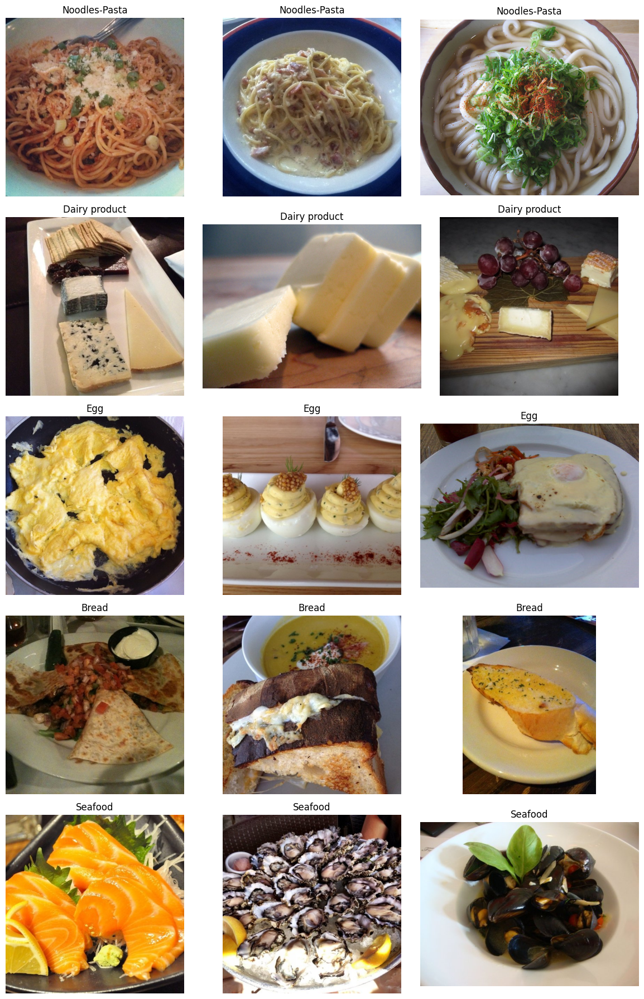

In [8]:
fig, axs = plt.subplots(5, 3, figsize=(12, 18))  # Smaller figure size and 3 images per class
count = 0

# Get the list of classes, excluding .ipynb_checkpoints
classes = [folder for folder in os.listdir('/content/training')]

# for every class in the dataset
for i in classes:
    # get the list of all images that belong to a particular class
    train_class = os.listdir(os.path.join('/content/training', i))
    print(f"Number of images in {i}={len(train_class)}")  # Print number of images in class

    plotted_images = 0  # To keep track of plotted images per class
    for k, j in enumerate(train_class[:3]):  # Limit to 3 images per class
        img_path = os.path.join('/content/training', i, j)
        if os.path.exists(img_path):
            axs[count][k].title.set_text(i)
            axs[count][k].imshow(PIL.Image.open(img_path))
            axs[count][k].axis('off')  # Hide axes for better visualization
            plotted_images += 1
        else:
            print(f"Image does not exist: {img_path}")  # Print if image does not exist

    # If less than 3 images were plotted, fill the remaining subplots with blank spaces
    for k in range(plotted_images, 3):
        axs[count][k].axis('off')  # Hide axes for blank subplots

    count += 1
    if count >= 5:
        break

fig.tight_layout()
plt.show()

In [ ]:
# check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

for i in os.listdir('/content/training'):
        Class_name.append(i)
        train_class = os.listdir(os.path.join('/content/training', i))
        print('Number of images in {}={}\n'.format(i, len(train_class)))
        No_images_per_class.append(len(train_class))

Number of images in Noodles-Pasta=440

Number of images in Dessert=1500

Number of images in Bread=994

Number of images in Dairy product=429

Number of images in Vegetable-Fruit=709

Number of images in Meat=1325

Number of images in Rice=280

Number of images in Seafood=855

Number of images in Soup=1500

Number of images in Egg=986

Number of images in Fried food=848



<ipython-input-10-18732ee10e17>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=Class_name, y=No_images_per_class, palette="cubehelix", ax=ax)
<ipython-input-10-18732ee10e17>:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(Class_name, rotation=45, ha='right')


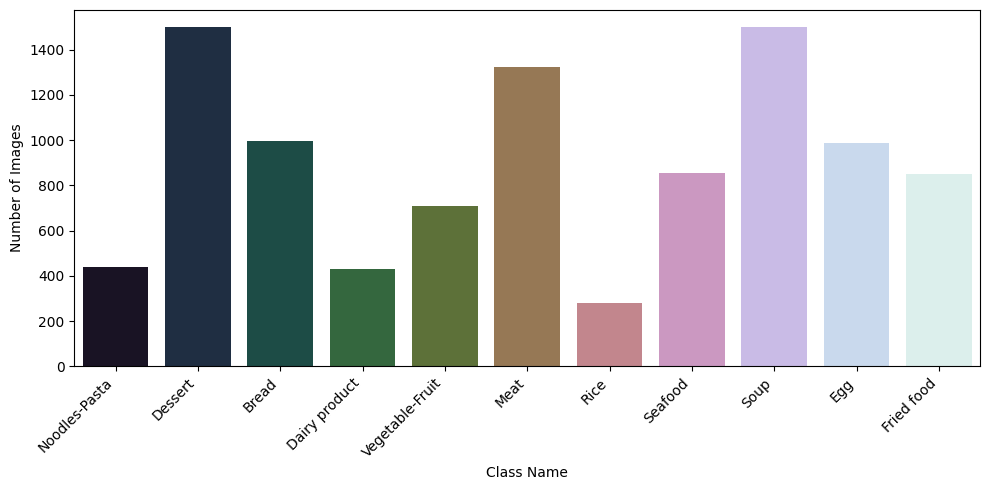

In [ ]:
# visualize the number of images in each class in the training dataset
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x=Class_name, y=No_images_per_class, palette="cubehelix", ax=ax)
ax.set_xticklabels(Class_name, rotation=45, ha='right')
ax.set_ylabel('Number of Images')
ax.set_xlabel('Class Name')
plt.tight_layout()
plt.show()


In [ ]:
# check the number of images in each class in the validation dataset
No_images_per_class_in_valid = []
Class_name_valid = []

for i in os.listdir('/content/validation'):
        Class_name_valid.append(i)
        train_class = os.listdir(os.path.join('/content/validation', i))
        print('Number of images in {}={}\n'.format(i, len(train_class)))
        No_images_per_class_in_valid.append(len(train_class))

Number of images in Noodles-Pasta=147

Number of images in Dessert=500

Number of images in Bread=362

Number of images in Dairy product=144

Number of images in Vegetable-Fruit=232

Number of images in Meat=449

Number of images in Rice=96

Number of images in Seafood=347

Number of images in Soup=500

Number of images in Egg=327

Number of images in Fried food=326



<ipython-input-12-da1537965c42>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=Class_name, y=No_images_per_class, palette="cubehelix", ax=ax)
<ipython-input-12-da1537965c42>:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(Class_name, rotation=45, ha='right')


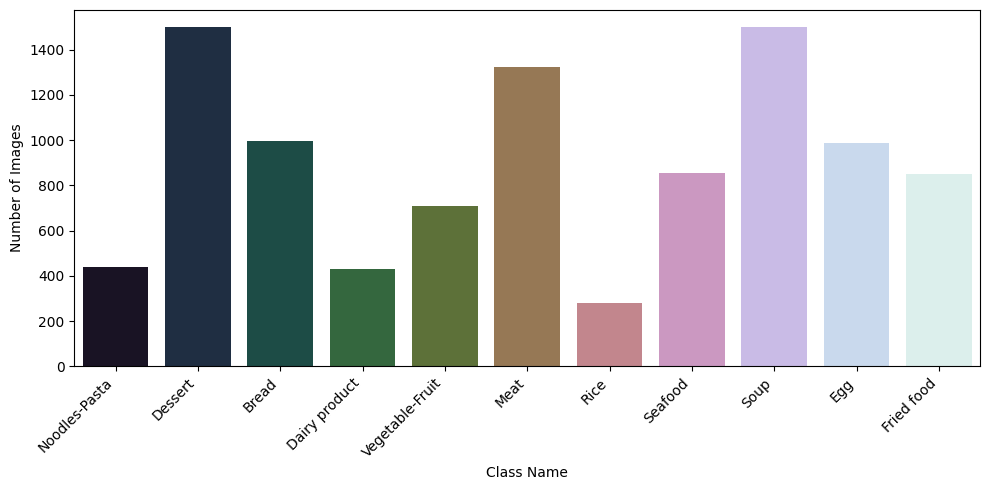

In [ ]:
# visualize the number of images in each class in the validation dataset
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x=Class_name, y=No_images_per_class, palette="cubehelix", ax=ax)
ax.set_xticklabels(Class_name, rotation=45, ha='right')
ax.set_ylabel('Number of Images')
ax.set_xlabel('Class Name')
plt.tight_layout()
plt.show()

# Image Augmentation and creation of data generator

In [9]:
# create run-time augmentation on training and test dataset
# For training datagenerator,  we add normalization, shear angle, zooming range and horizontal flip
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True
)

# For test datagenerator, we only normalize the data.
test_datagen = ImageDataGenerator(rescale=1./255)

valid_datagen = ImageDataGenerator(
        rescale=1./255,
        zoom_range=0.8,
        horizontal_flip=True
)

In [10]:
# Create data generator for training, validation and test dataset.
train_generator = train_datagen.flow_from_directory(
        '/content/training',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        '/content/evaluation',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')

valid_generator = valid_datagen.flow_from_directory(
        '/content/validation',
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')


Found 9866 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.


# Build Deep Learning Model using pre-trained InceptionResNetv2

In [11]:
# load the inception resnetv2 model
basemodel = InceptionResNetV2(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256,256,3)))

219055592/219055592 [==============================] - 2s 0us/step


In [12]:
# print the model summary
basemodel.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 127, 127, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 127, 127, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 127, 127, 32)         0         ['batch_norm

In [ ]:
# Freeze the basemodel weights , so these weights won't change during training
basemodel.trainable = False

In [13]:
# Add classification head to the model
headmodel = basemodel.output
headmodel = GlobalAveragePooling2D(name = 'Gobal_avg_pool')(headmodel)
headmodel = Flatten(name = 'Flatten')(headmodel)
headmodel = Dense(256, activation = 'relu' , name = 'dense1')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(128, activation = 'relu' , name = 'dense2')(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(11, activation = 'softmax' , name = 'dense3')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

# Compile and train learning model

In [14]:
# compile the model

model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=0.01),
    metrics=['accuracy']
)

In [15]:
# using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=25)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="weights.hdf5", verbose=1, save_best_only=True)

In [ ]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 32, epochs = 1, validation_data= valid_generator, validation_steps= valid_generator.n // 32, callbacks=[checkpointer, earlystopping])

308/308 [==============================] - ETA: 0s - loss: 1.2657 - accuracy: 0.6064
Epoch 1: val_loss improved from inf to 1.34671, saving model to weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


308/308 [==============================] - 269s 874ms/step - loss: 1.2657 - accuracy: 0.6064 - val_loss: 1.3467 - val_accuracy: 0.5824


# Fine Tuning the Trained model


In [16]:
# unfreeze the weights in the base model, now these weights will be changed during training
basemodel.trainable = True

In [17]:
# using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="weights_fine.hdf5", verbose=1, save_best_only=True)

In [21]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

In [ ]:
# fine tune the model with very low learning rate
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

history = model.fit(train_generator, steps_per_epoch= train_generator.n // 32, epochs = 3, validation_data= valid_generator, validation_steps= valid_generator.n // 32, callbacks=[checkpointer, earlystopping])

Epoch 1/3
308/308 [==============================] - ETA: 0s - loss: 1.0539 - accuracy: 0.6735
Epoch 1: val_loss improved from inf to 1.08905, saving model to weights_fine.hdf5
308/308 [==============================] - 438s 1s/step - loss: 1.0539 - accuracy: 0.6735 - val_loss: 1.0891 - val_accuracy: 0.6893
Epoch 2/3
308/308 [==============================] - ETA: 0s - loss: 0.7036 - accuracy: 0.7893
Epoch 2: val_loss did not improve from 1.08905
308/308 [==============================] - 333s 1s/step - loss: 0.7036 - accuracy: 0.7893 - val_loss: 1.0998 - val_accuracy: 0.7088
Epoch 3/3
308/308 [==============================] - ETA: 0s - loss: 0.5699 - accuracy: 0.8316
Epoch 3: val_loss improved from 1.08905 to 0.86986, saving model to weights_fine.hdf5
308/308 [==============================] - 340s 1s/step - loss: 0.5699 - accuracy: 0.8316 - val_loss: 0.8699 - val_accuracy: 0.7649


# Assessing Performance of the trained model

In [22]:
# Evaluate the performance of the model
evaluate = model.evaluate_generator(test_generator, steps = test_generator.n // 32, verbose =1)

print('Accuracy Test : {}'.format(evaluate[1]))

<ipython-input-22-b63f0cd77376>:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  evaluate = model.evaluate_generator(test_generator, steps = test_generator.n // 32, verbose =1)


104/104 [==============================] - 34s 208ms/step - loss: 2.4433 - accuracy: 0.1088
Accuracy Test : 0.10877403616905212


In [23]:
# assigning label names to the corresponding indexes
labels = {0: 'Bread', 1: 'Dairy product', 2: 'Dessert', 3:'Egg', 4: 'Fried food', 5:'Meat',6:'Noodles-Pasta',7:'Rice', 8:'Seafood',9:'Soup',10: 'Vegetable-Fruit'}

In [24]:
# loading images and their predictions

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
# import cv2

prediction = []
original = []
image = []
count = 0
for i in os.listdir('./evaluation'):
  for item in os.listdir(os.path.join('./evaluation',i)):
    #code to open the image
    img= PIL.Image.open(os.path.join('./evaluation',i,item))
    #resizing the image to (256,256)
    img = img.resize((256,256))
    #appending image to the image list
    image.append(img)
    #converting image to array
    img = np.asarray(img, dtype= np.float32)
    #normalizing the image
    img = img / 255
    #reshaping the image in to a 4D array
    img = img.reshape(-1,256,256,3)
    #making prediction of the model
    predict = model.predict(img)
    #getting the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #appending the predicted class to the list
    prediction.append(labels[predict])
    #appending original class to the list
    original.append(i)


1/1 [==============================] - 0s 37ms/step


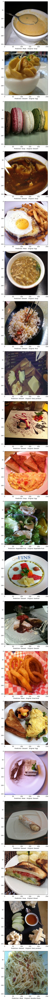

In [25]:
# visualizing the results
import random
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20,1,i+1)
    plt.xlabel("Prediction -" + prediction[j] +"   Original -" + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [26]:
# classification report
print(classification_report(np.asarray(original), np.asarray(prediction)))

                 precision    recall  f1-score   support

          Bread       0.06      0.00      0.01       368
  Dairy product       0.00      0.00      0.00       148
        Dessert       0.17      0.50      0.25       500
            Egg       0.12      0.07      0.09       335
     Fried food       0.00      0.00      0.00       287
           Meat       0.03      0.04      0.03       432
  Noodles-Pasta       0.00      0.00      0.00       147
           Rice       0.00      0.00      0.00        96
        Seafood       0.00      0.00      0.00       303
           Soup       0.01      0.01      0.01       500
Vegetable-Fruit       0.22      0.32      0.26       231

       accuracy                           0.11      3347
      macro avg       0.05      0.09      0.06      3347
   weighted avg       0.06      0.11      0.07      3347



Text(0.5, 1.0, 'Confusion_matrix')

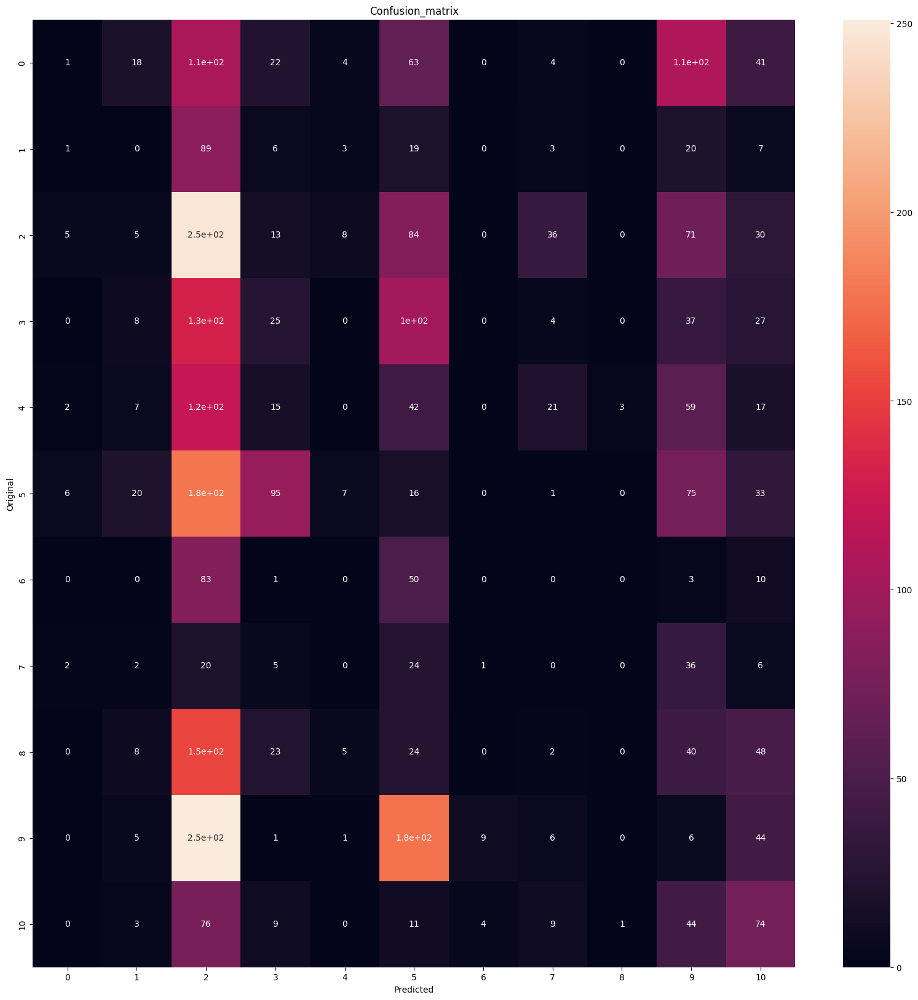

In [27]:
# plot confusion matrix

plt.figure(figsize=(20,20))
cm = confusion_matrix(np.asarray(original), np.asarray(prediction))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax)

ax.set_xlabel('Predicted')
ax.set_ylabel('Original')
ax.set_title('Confusion_matrix')
